# Exploratory Data Analysis

In this notebook we explore the domain shift between **single-label training images** and **multi-label test images**.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import torch
from plantclef.config import get_device

print(f"PyTorch Version: {torch.__version__}")
device = get_device()
print(f"Using device: {device}")

PyTorch Version: 2.6.0+cu124
Using device: cuda


In [3]:
import pandas as pd
from pathlib import Path

# Get list of stored filed in cloud bucket
root = Path().resolve().parents[0]
print(root)
! date

/storage/home/hcoda1/9/mgustineli3/clef/pytorch-plantclef
Mon Mar 24 03:27:48 PM EDT 2025


In [4]:
# path to data
data_path = f"{root}/data/parquet/"
train_path = f"{data_path}/train_pytorch_webinar_filtered"
test_path = f"{data_path}/test_2025_pytorch_webinar"

# read train/test data
train_df = pd.read_parquet(train_path)
test_df = pd.read_parquet(test_path)

# display data
print(train_df.shape)
display(train_df.head(3))
display(test_df.head(3))

(2020, 22)


,image_name,path,data,organ,species_id,obs_id,license,partner,author,altitude,...,gbif_species_id,species,genus,family,dataset,publisher,references,url,learn_tag,image_backup_url
0,28e2fbd0cc93d82d7de3ed5783c64816074955e0.jpg,/PlantCLEF2024/train/1356404/28e2fbd0cc93d82d7...,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...,leaf,1356404,1000992998,cc-by-sa,None,carloz,60.0,...,5275012.0,Pteridium aquilinum (L.) Kuhn,Pteridium,Dennstaedtiaceae,plantnet,plantnet,https://identify.plantnet.org/fr/k-southwester...,https://bs.plantnet.org/image/o/28e2fbd0cc93d8...,train,https://lab.plantnet.org/LifeCLEF/PlantCLEF202...
1,47b5db375e741fdc09b5e133d5bfef0285aa695c.jpg,/PlantCLEF2024/train/1418612/47b5db375e741fdc0...,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...,habit,1418612,2634386735,http://creativecommons.org/licenses/by-nc/4.0/,None,René Stalder,NaN,...,2728572.0,Carex firma Host,Carex,Cyperaceae,gbif,iNaturalist,https://www.inaturalist.org/photos/75173958,https://inaturalist-open-data.s3.amazonaws.com...,train,https://lab.plantnet.org/LifeCLEF/PlantCLEF202...
2,c6a6b172ab03374ad1bb713b7e7b37dd84f094a1.jpg,/PlantCLEF2024/train/1722578/c6a6b172ab03374ad...,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...,habit,1722578,3802273349,http://creativecommons.org/licenses/by/4.0/,None,Eleftherios Katsillis,NaN,...,8241209.0,Daucus pumilus (L.) Hoffmanns. & Link,Daucus,Apiaceae,gbif,iNaturalist,https://www.inaturalist.org/photos/121766424,https://inaturalist-open-data.s3.amazonaws.com...,train,https://lab.plantnet.org/LifeCLEF/PlantCLEF202...


,image_name,path,data
0,CBN-PdlC-C4-20180723.jpg,/test/data/PlantCLEF/PlantCLEF2025/DataOut/tes...,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...
1,LISAH-BOU-0-30-20230512.jpg,/test/data/PlantCLEF/PlantCLEF2025/DataOut/tes...,b'\xff\xd8\xff\xdb\x00C\x00\x06\x04\x05\x06\x0...
2,CBN-PdlC-C4-20140811.jpg,/test/data/PlantCLEF/PlantCLEF2025/DataOut/tes...,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...


### looking at some images

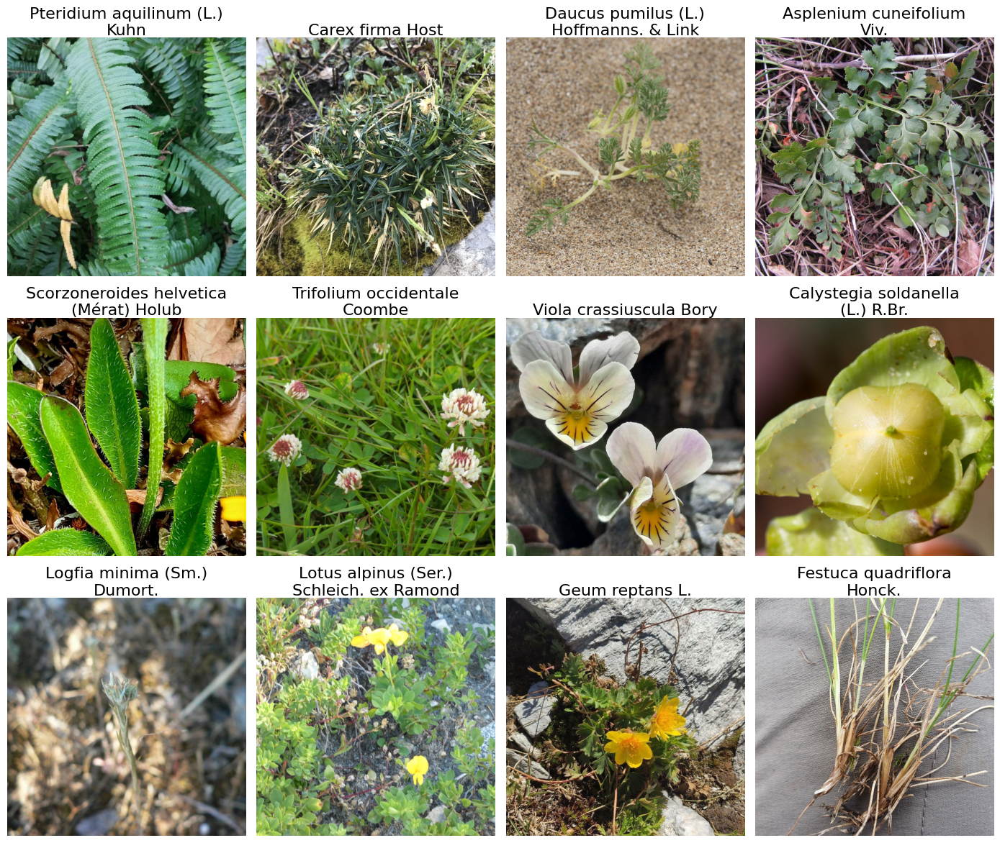

In [5]:
from plantclef.plotting import plot_images_from_binary


plot_images_from_binary(
    train_df,
    data_col="data",
    label_col="species",
    grid_size=(3, 4),
    crop_square=True,
    figsize=(14, 12),
    dpi=100,
)

In [6]:
# interesting test images
images = [
    "CBN-Pyr-03-20230706.jpg",
    "OPTMix-012-P2-207-20231201.jpg",
    "OPTMix-0178-P1-661-20231006.jpg",
    "OPTMix-0333-P2-115-20231212.jpg",
    "OPTMix-0598-P4-104-20231207.jpg",
    "RNNB-1-4-20240117.jpg",
    "RNNB-1-7-20230512.jpg",
    "RNNB-1-8-20230512.jpg",
    "RNNB-4-2-20240118.jpg",
    "RNNB-8-8-20240118.jpg",
    "CBN-can-E6-20230706.jpg",
    "CBN-Pla-A3-20140812.jpg",
]

In [7]:
# select subset of test dataframe
subset_test_df = test_df[test_df["image_name"].isin(images)]
subset_test_df.count()  # 12 images

image_name    12
path          12
data          12
dtype: int64

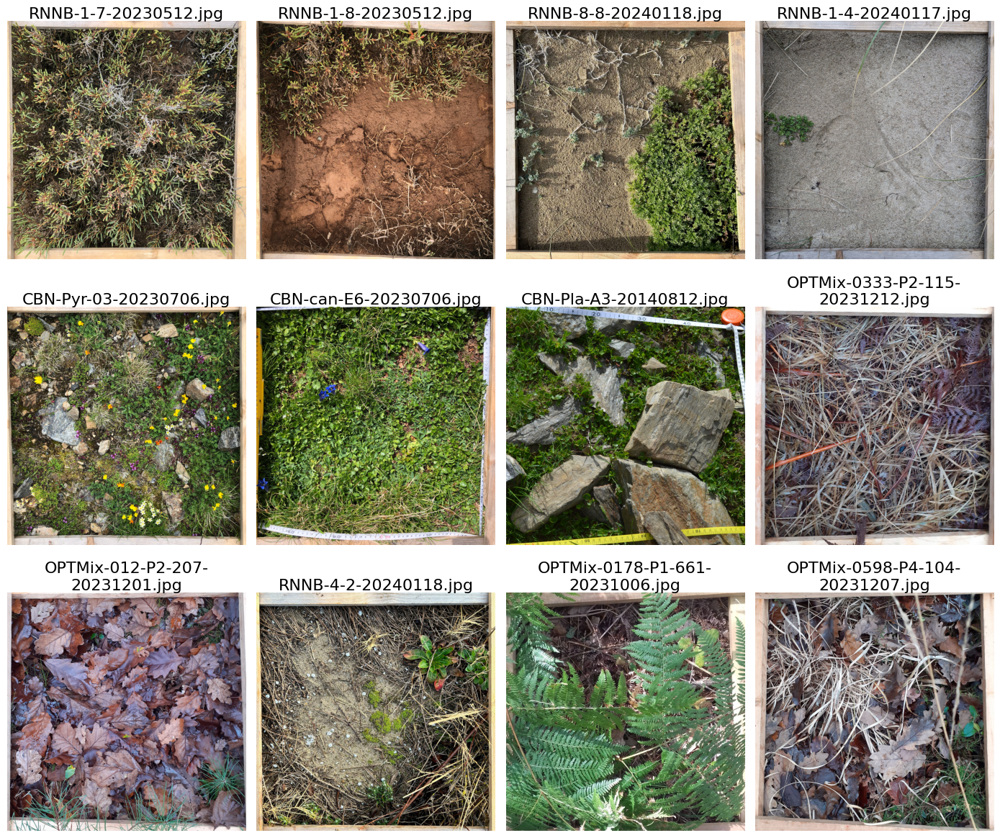

In [8]:
# display the images in a grid with binomial names
plot_images_from_binary(
    subset_test_df,
    data_col="data",
    label_col="image_name",
    grid_size=(3, 4),
    crop_square=True,
    figsize=(14, 12),
    dpi=100,
)

## grid of image tiles

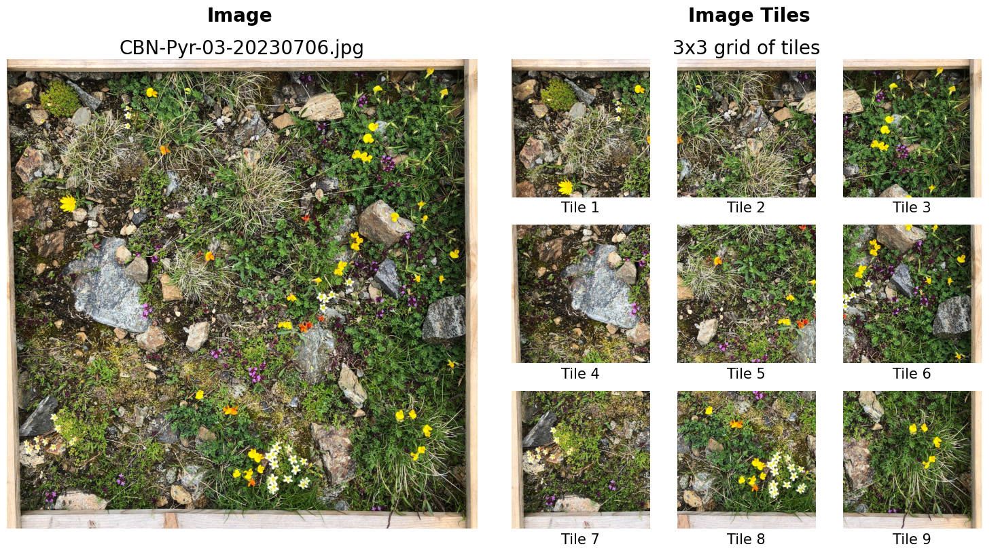

In [9]:
from plantclef.plotting import plot_image_tiles

# select image from test set
image_name = "CBN-Pyr-03-20230706.jpg"
test_image_df = test_df[test_df["image_name"] == image_name]

plot_image_tiles(
    test_image_df,
    data_col="data",
    grid_size=3,
)

In [10]:
test_df.count()

image_name    200
path          200
data          200
dtype: int64